In [ ]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib as plt
import glob

## **SECTION 1: IMPORTING INDIVIDUAL FILES AND PREPARING A MEGAFILE WITH LOGICAL MODIFICATIONS**

---



####This is just to demonstrate how initial files (input+output+supplementary) were acquired from drive followed by merging them logically to make a super merged dataset.

---

In [ ]:
path = "/content/drive/MyDrive/2026_BDB_PK/" #Change your path depending upon the file location

In [ ]:
#Vertical stacking of all the 18 input files and naming it 'all_input'
all_input_files = sorted(glob.glob(path + "input_*.csv"))

all_input = pd.concat((pd.read_csv(f) for f in all_input_files), ignore_index=True)
all_input.shape

(4880579, 23)

In [ ]:
#Vertical stacking of all the 18 output files and naming it 'all_output'
all_output_files = sorted(glob.glob(path + "output_*.csv"))

all_output = pd.concat((pd.read_csv(r) for r in all_output_files), ignore_index=True)
all_output.shape

(562936, 6)

In [ ]:
#Filtering out all false instances from the input file
all_false = all_input[all_input['player_to_predict']==False].reset_index(drop = True)

In [ ]:
#Filtering out all true instances from the input file
all_true = all_input[all_input['player_to_predict']==True].reset_index(drop=True)

In [ ]:
#Forming unique combinations to parse through dataset
unique_set = None
unique_set = all_true[['game_id', 'play_id', 'nfl_id']]
unique_set = unique_set.drop_duplicates()

unique_set_list = []
for x in unique_set.values:
  unique_set_list.append(x.tolist())

In [ ]:
#This code merges TRUE players across input files and merges the corresponding output file with continued frame id in order

from tqdm import tqdm
pieces = []
for x in tqdm(unique_set.values, desc = "Processing"):
  a = all_true[(all_true[['game_id', 'play_id', 'nfl_id']]==x).all(axis=1)]
  b = all_output[(all_output[['game_id', 'play_id', 'nfl_id']]==x).all(axis=1)]
  b.loc[:,'frame_id'] = b.loc[:,'frame_id'] + max(a['frame_id'])
  pieces.append(a)
  pieces.append(b)

Processing: 100%|██████████| 46045/46045 [16:19<00:00, 47.03it/s]


In [ ]:
#Combining with the remaining FALSE player data
combined_data = pd.concat(pieces+[all_false], ignore_index = True)

In [ ]:
#Identifying the columns to forward fill and performing the operation
columns_to_ffill = ['player_to_predict', 'play_direction', 'absolute_yardline_number', 'player_name', 'player_height',
                     'player_weight', 'player_birth_date', 'player_position', 'player_side', 'player_role',
                     'num_frames_output', 'ball_land_x', 'ball_land_y']


for cols in columns_to_ffill:
  combined_data[cols] = combined_data[cols].ffill()

/tmp/ipython-input-4077097505.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_data[cols] = combined_data[cols].ffill()


In [ ]:
#Saving the data as 'super_data.csv'
##combined_data.to_csv('/content/drive/MyDrive/2026_BDB_PK/super_data.csv', index=False)

In [ ]:
#Reading back the data
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/2026_BDB_PK/super_data.csv')

In [ ]:
data.shape

(5443515, 23)

In [ ]:
#Reading supplementary data
supplementary = pd.read_csv('/content/drive/MyDrive/2026_BDB_PK/supplementary_data.csv')

/tmp/ipython-input-2381172583.py:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  supplementary = pd.read_csv('/content/drive/MyDrive/2026_BDB_PK/supplementary_data.csv')


In [ ]:
#Identifying columns to be used from supplementary data to join with the super_data
cols_to_join = ['game_id', 'play_id', 'quarter', 'game_clock', 'down', 'yards_to_go', 'home_team_abbr', 'visitor_team_abbr', 'possession_team',
       'defensive_team', 'yardline_side', 'yardline_number', 'play_nullified_by_penalty', 'pass_result', 'pass_length',
       'offense_formation',  'receiver_alignment', 'route_of_targeted_receiver', 'play_action', 'dropback_type', 'dropback_distance', 'pass_location_type',
        'defenders_in_the_box', 'team_coverage_man_zone', 'team_coverage_type', 'penalty_yards' , 'pre_penalty_yards_gained', 'yards_gained' ]

supplementary = supplementary[cols_to_join]

In [ ]:
#Merging both the dataframes using left join

merged_super_data = data.merge(supplementary, on = ['game_id', 'play_id'], how = 'left')

In [ ]:
#Saving the final merged version as 'merged_super_data.csv'
##merged_super_data.to_csv('/content/drive/MyDrive/2026_BDB_PK/merged_super_data.csv', index=False)

## **SECTION 2: PREPARING THE ON-FIELD PLAYWISE VISUALIZATION**

---


####If you have already run Section - 1 once, you can start running the cells from here if you open the notebook again.

---



In [ ]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib as plt

In [ ]:
# Install dependencies as needed:
#pip install kagglehub[pandas-datasets]
import kagglehub
import pandas as pd
from kagglehub import KaggleDatasetAdapter

# Set the path to the file you'd like to load
file_path = "merged_super_data.csv"

# Load the latest version
merged = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "yashkalpeshshah1196/merged-super-data",
  file_path,
  # Provide any additional arguments like
  # sql_query or pandas_kwargs. See the
  # documenation for more information:
  # https://github.com/Kaggle/kagglehub/blob/main/README.md#kaggledatasetadapterpandas
)

merged = pd.DataFrame(merged)

/tmp/ipython-input-3713205345.py:11: DeprecationWarning: Use dataset_load() instead of load_dataset(). load_dataset() will be removed in a future version.
  merged = kagglehub.load_dataset(


100%|██████████| 1.59G/1.59G [00:23<00:00, 73.4MB/s]
/usr/local/lib/python3.12/dist-packages/kagglehub/pandas_datasets.py:91: DtypeWarning: Columns (39) have mixed types. Specify dtype option on import or set low_memory=False.
  result = read_function(


In [ ]:
#Creating list of unique combinations of game_id and play_id from the main data
merge_set = merged[['game_id', 'play_id']].drop_duplicates()
merge_set_list = []
for x in merge_set.values:
  merge_set_list.append(x.tolist())

In [ ]:
#We are giving the user two options - run a random play / enter a valid combination of game_id, play_id

import random

#To use a random play, remove the comment from next 2 lines
# game_id, play_id = random.choice(merge_set_list)
# game_id,play_id

#To use a manual play, remove the comments from next 2 lines
game_id, play_id = int(input("Enter Game Id: ")),int(input("Enter Play Id: "))
game_id, play_id

Enter Game Id: 2023121704
Enter Play Id: 697


(2023121704, 697)

In [ ]:
play_data = merged[(merged[['game_id', 'play_id']]==[game_id,play_id]).all(axis=1)].reset_index(drop=True)
play_data

,game_id,play_id,player_to_predict,nfl_id,frame_id,play_direction,absolute_yardline_number,player_name,player_height,player_weight,...,play_action,dropback_type,dropback_distance,pass_location_type,defenders_in_the_box,team_coverage_man_zone,team_coverage_type,penalty_yards,pre_penalty_yards_gained,yards_gained
0,2023121704,697,True,46757,1,left,52.0,Charvarius Ward,6-1,195.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
1,2023121704,697,True,46757,2,left,52.0,Charvarius Ward,6-1,195.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
2,2023121704,697,True,46757,3,left,52.0,Charvarius Ward,6-1,195.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
3,2023121704,697,True,46757,4,left,52.0,Charvarius Ward,6-1,195.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
4,2023121704,697,True,46757,5,left,52.0,Charvarius Ward,6-1,195.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490,2023121704,697,False,47784,29,left,52.0,Kyler Murray,5-10,207.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
491,2023121704,697,False,47784,30,left,52.0,Kyler Murray,5-10,207.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
492,2023121704,697,False,47784,31,left,52.0,Kyler Murray,5-10,207.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0
493,2023121704,697,False,47784,32,left,52.0,Kyler Murray,5-10,207.0,...,False,TRADITIONAL,3.72,INSIDE_BOX,6,ZONE_COVERAGE,COVER_3_ZONE,NaN,0,0


In [ ]:
#Calculating frame details for the corresponding play
total_frames = max(play_data['frame_id'])
output_frames = int(max(play_data['num_frames_output']))
output_start = total_frames - output_frames + 1

print(f"The loaded play consists of {total_frames} frames in total. It has {output_frames} frames in the output which begins at frame {output_start}")

The loaded play consists of 44 frames in total. It has 11 frames in the output which begins at frame 34


In [ ]:
#Extracting the coordinates of the Landing Point of the Ball rounded off to 2 decimal places
LP_x, LP_y = play_data[['ball_land_x', 'ball_land_y']].round(3).iloc[0]
LP_x, LP_y

(43.4, 25.9)

In [ ]:
# ========= COLOR MAP SETUP =========
# This block defines the color assignment logic for all artifacts
# Run this FIRST before any other scripts that follow

position_base_colors = {
    'CB': (0.1, 0.4, 0.9),      # Blue
    'S': (1.0, 0.5, 0.0),       # Orange (Safety)
    'SS': (1.0, 0.6, 0.0),      # Light Orange (Strong Safety)
    'FS': (1.0, 0.7, 0.0),      # Lighter Orange (Free Safety)
    'WR': (0.9, 0.1, 0.1),      # Red
    'OLB': (0.2, 0.8, 0.2),     # Green (Outside Linebacker)
    'ILB': (0.3, 0.9, 0.3),     # Light Green (Inside Linebacker)
    'RB': (0.9, 0.2, 0.7),      # Pink
    'TE': (0.8, 0.2, 0.8),      # Magenta
    'FB': (0.7, 0.3, 0.9),      # Purple
    'MLB': (0.4, 0.9, 0.4),     # Light Green (Middle Linebacker)
    'DE': (1.0, 0.2, 0.2),      # Bright Red
    'DT': (0.9, 0.8, 0.0),      # Gold
    'NT': (0.95, 0.85, 0.1),    # Light Gold
    'LB': (0.5, 0.8, 0.5),      # Medium Green
    'QB': (0.2, 0.2, 0.8),      # Dark Blue
    'T': (0.6, 0.3, 0.9),       # Light Purple
    'P': (0.5, 0.5, 0.5),       # Gray
    'K': (0.6, 0.6, 0.6),       # Light Gray
}

def vary_color_hue(base_color, variation_idx, position=None, max_variations=5):
    """
    Vary a base color by adjusting brightness for players at same position.
    Uses HSV color space to lighten/darken the color instead of rotating hue.

    Args:
        base_color: (r, g, b) tuple
        variation_idx: Index of variation (0, 1, 2, etc.)
        position: Player position code (e.g., 'CB', 'S', 'OLB')
        max_variations: Maximum number of variations

    Returns:
        (r, g, b) tuple with adjusted brightness
    """
    import colorsys

    if variation_idx == 0:
        return base_color

    # Convert RGB to HSV
    h, s, v = colorsys.rgb_to_hsv(base_color[0], base_color[1], base_color[2])

    # Adjust VALUE (brightness) with clear distinctions
    # Create alternating bright and dark versions
    # variation_idx=1: much darker, variation_idx=2: much lighter, variation_idx=3: darker, etc.
    if variation_idx == 1:
        v = v * 0.4  # Much darker
    elif variation_idx == 2:
        v = min(1.0, v * 1.6)  # Much lighter
    elif variation_idx == 3:
        v = v * 0.25  # Even darker
    elif variation_idx == 4:
        v = min(1.0, v * 1.8)  # Even lighter

    # Keep saturation high for color distinctness
    s = max(0.7, s)

    # Convert back to RGB
    r, g, b = colorsys.hsv_to_rgb(h, s, v)
    return (r, g, b)

def build_color_map(all_players_df, df_play_all, targeted_receiver=None):
    """
    Build color_map based on ALL players in the play.

    Rules:
    - ALL players get color assignments (ensures consistent colors everywhere)
    - Targeted receiver: always bright RED (overrides position)
    - Offensive players: always bright RED
    - Defensive players: bright color based on their POSITION
      (players with same position get different hues for distinction)

    Args:
        all_players_df: DataFrame with player_name, player_side, player_position columns
                       (typically created from df_play_all[['player_name', 'player_side', 'player_position']].drop_duplicates())
        df_play_all: DataFrame with all play data (used for position info if needed)
        targeted_receiver: Name of targeted receiver (optional, will be highlighted RED)

    Returns:
        color_map: Dictionary mapping player_name -> (r, g, b) tuple
    """
    color_map = {}

    # Count players per position to assign different hues
    position_counts = {}
    position_indices = {}

    # First pass: count defensive players per position
    for idx, row in all_players_df.iterrows():
        player_side = row['player_side'] if 'player_side' in row else None
        position = row['player_position'] if 'player_position' in row else 'Unknown'

        # Only count defensive players (offense all get red)
        if player_side == 'Defense':
            position_counts[position] = position_counts.get(position, 0) + 1

    # Initialize position tracking
    position_indices = {pos: 0 for pos in position_counts}

    # Second pass: assign colors to ALL players
    for idx, row in all_players_df.iterrows():
        player_name = row['player_name']
        player_side = row['player_side'] if 'player_side' in row else None
        position = row['player_position'] if 'player_position' in row else 'Unknown'

        # Targeted receiver always bright red
        if player_name == targeted_receiver:
            color_map[player_name] = (1.0, 0.0, 0.0)
        # Offensive players always bright red
        elif player_side == 'Offense':
            color_map[player_name] = (1.0, 0.0, 0.0)
        # Defensive players get bright color by position with variation
        elif player_side == 'Defense':
            base_color = position_base_colors.get(position, (0.5, 0.5, 0.5))
            variation_idx = position_indices.get(position, 0)
            color_map[player_name] = vary_color_hue(base_color, variation_idx, position=position)
            position_indices[position] += 1
        else:
            color_map[player_name] = (0.5, 0.5, 0.5)

    return color_map

def get_player_color(player_name, color_map, player_side=None, has_pei=True):
    """
    Get color for a player based on color_map.

    Args:
        player_name: Name of player
        color_map: Color map dictionary
        player_side: 'Offense' or 'Defense' (used if player not in color_map)
        has_pei: Whether player has PEI values (if False, returns gray)

    Returns:
        (r, g, b) tuple color
    """
    if not has_pei:
        return (0.6, 0.6, 0.6)  # Gray for no PEI

    return color_map.get(player_name, (0.5, 0.5, 0.5))

print("Color map setup block loaded")

Color map setup block loaded



ANIMATION: Field Only - Game 2023121704, Play 697
Speed: Real-time (10 frames per second)

Loading data...
Processing ball trajectory...
  Throw frame: 34
  End frame: 44
  Ball landing: (43.4, 25.9)
  Calculating ball trajectory from passer to landing...
  Passer's last location: (60.0, 29.0) at frame 33
  Calculated trajectory for 11 frames
  Frames: 1 to 44
  Targeted Receiver: Trey McBride
Processing players...
  Building color_map from all players in play...
  ✓ Color map built with 13 players
  13 players loaded
  44 frames total
  Scrimmage line at: 52.0
Animating 44 frames (real-time speed: 10 fps)...

Animation complete!



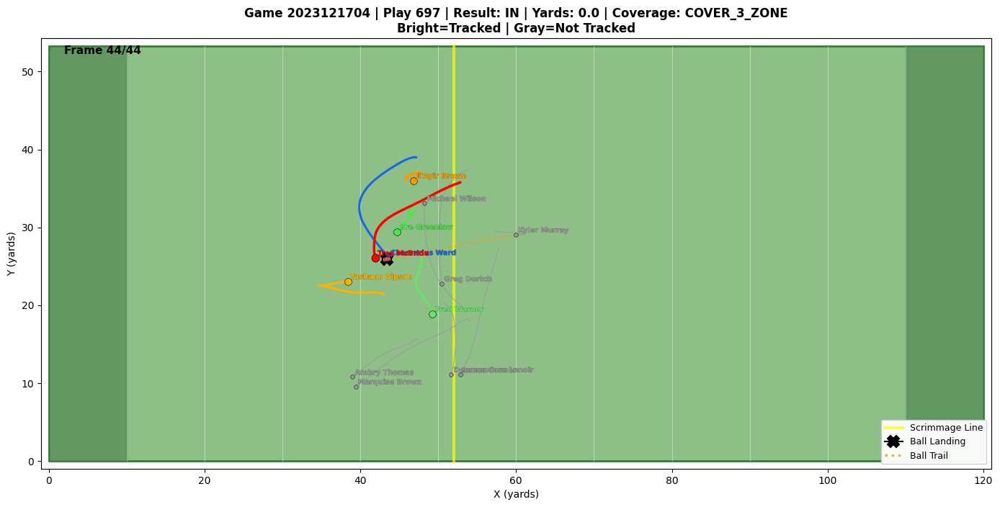

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import patches
from matplotlib.animation import FuncAnimation
from matplotlib import rc
import matplotlib.patheffects as pe
import gc

# # ---- Render animation inline (no ffmpeg needed)
rc('animation', html='jshtml')
plt.rcParams['figure.max_open_warning'] = 0

# ========= CONFIG =========

FIELD_W = 53.3
FIELD_L = 120.0
FRAME_SKIP = 1
INTERVAL_MS = 100

# Use game_id and play_id from the interactive script
print(f"\n{'='*100}")
print(f"ANIMATION: Field Only - Game {game_id}, Play {play_id}")
print(f"Speed: Real-time (10 frames per second)")
print(f"{'='*100}\n")

# ========= LOAD & PREPROCESS =========
print("Loading data...")
gc.collect()

# Use only necessary columns to save memory
cols_to_use = ['game_id','play_id','frame_id','nfl_id','player_name','player_role', 'pass_result',
        'player_side','x','y','num_frames_output','ball_land_x','ball_land_y',
        'player_to_predict','ball_x','ball_y','absolute_yardline_number','yards_gained','team_coverage_type','player_position']

exist_cols = [c for c in cols_to_use if c in play_data.columns]
play = play_data[exist_cols].copy()


#play['frame_id'] = pd.to_numeric(play['frame_id'], errors='coerce')
play = play.sort_values(['frame_id','nfl_id']).reset_index(drop=True)

# Get basic info
N = output_frames
fmin = 1
fmax = total_frames

# Ball landing
bx = LP_x
by = LP_y

# ========= EXTRACT BALL TRAJECTORY =========
print("Processing ball trajectory...")
ball_trajectory = {}
frames_all = play['frame_id'].unique()
frame_map = {f: i for i, f in enumerate(frames_all)}

# Determine throw frame using num_frames_output
throw_frame = output_start
true_end = total_frames
print(f"  Throw frame: {throw_frame}")
print(f"  End frame: {true_end}")
print(f"  Ball landing: ({bx}, {by})")

# If no direct ball data, calculate trajectory from passer location to landing
print("  Calculating ball trajectory from passer to landing...")

passer_data = play[play['player_role'] == 'Passer'].sort_values('frame_id')

# Get passer's LAST position (not first)
passer_x = float(passer_data['x'].iloc[-1])
passer_y = float(passer_data['y'].iloc[-1])
passer_last_frame = int(passer_data['frame_id'].iloc[-1])

print(f"  Passer's last location: ({passer_x:.1f}, {passer_y:.1f}) at frame {passer_last_frame}")
for fid in frames_all:
  if fid >= throw_frame:
    progress = (fid - throw_frame) / max(1, (true_end - throw_frame))
    progress = np.clip(progress, 0.0, 1.0)
    ball_x_est = float(passer_x + (bx - passer_x) * progress)
    ball_y_est = float(passer_y + (by - passer_y) * progress)
    ball_trajectory[fid] = (np.round(ball_x_est,2),np.round(ball_y_est,2))

print(f"  Calculated trajectory for {len(ball_trajectory)} frames")


# Targeted receiver
tr_data = play[play['player_role'] == 'Targeted Receiver']
targeted_receiver = tr_data['player_name'].iloc[0]

print(f"  Frames: {fmin} to {fmax}")
print(f"  Targeted Receiver: {targeted_receiver}")

# ========= BUILD PLAYER DATA =========
print("Processing players...")

player_list = play[['nfl_id','player_name']].drop_duplicates().values
players = []

frame_count = len(frames_all)

# Build color_map from ALL players in this play (consistent approach)
print("  Building color_map from all players in play...")
all_players_data = play[['player_name', 'player_side', 'player_position']].drop_duplicates()
color_map = build_color_map(all_players_data, play, targeted_receiver)
print(f"  ✓ Color map built with {len(color_map)} players")


# Build player data
for pid, pname in player_list:
    p_data = play[play['nfl_id'] == pid].sort_values('frame_id')
    x_al = np.full(frame_count, np.nan, dtype=np.float32)
    y_al = np.full(frame_count, np.nan, dtype=np.float32)

    for _, row in p_data.iterrows():
        idx = frame_map.get(int(row['frame_id']))
        if idx is not None:
            x_al[idx] = float(row['x'])
            y_al[idx] = float(row['y'])

    p_role = p_data['player_role'].iloc[0] if 'player_role' in p_data.columns else None
    p_side = p_data['player_side'].iloc[0] if 'player_side' in p_data.columns else None
    p_pred = bool(p_data['player_to_predict'].iloc[0]) if 'player_to_predict' in p_data.columns else False

    # Check if player has entry in color_map
    has_color = pname in color_map

    # If player_to_predict == False, use gray color
    if not p_pred:
        color = (0.6, 0.6, 0.6)  # Gray for non-tracked players
        marker_size = 4
        line_width = 0.8
        alpha = 0.9
        is_key_player = False
    else:
        # Get color using setup function
        color = get_player_color(pname, color_map, player_side=p_side, has_pei=has_color)

        # Determine styling based on whether player is tracked/targeted
        if pname == targeted_receiver:
            marker_size = 8
            line_width = 2.5
            alpha = 1.0
            is_key_player = True
        elif p_side == 'Defense' or p_role == 'Targeted Receiver':
            marker_size = 7
            line_width = 2.2
            alpha = 1.0
            is_key_player = True
        else:
            marker_size = 5
            line_width = 1.2
            alpha = 0.6
            is_key_player = False

    players.append({
        'name': pname,
        'x': x_al,
        'y': y_al,
        'color': color,
        'marker_size': marker_size,
        'line_width': line_width,
        'alpha': alpha,
        'is_key_player': is_key_player
    })

print(f"  {len(players)} players loaded")
print(f"  {frame_count} frames total")

# ========= FIELD ANIMATION =========
fig, ax_field = plt.subplots(figsize=(14, 7), dpi=100)

# Main field background
ax_field.add_patch(patches.Rectangle((0, 0), FIELD_L, FIELD_W,
                               facecolor='#8DBF87', edgecolor='#2E7D32', linewidth=2, zorder=0))

# Endzones (darker shade at each end)
ax_field.add_patch(patches.Rectangle((0, 0), 10, FIELD_W,
                               facecolor='#5a8f5a', edgecolor='#2E7D32', linewidth=1, zorder=0, alpha=0.8))
ax_field.add_patch(patches.Rectangle((FIELD_L - 10, 0), 10, FIELD_W,
                               facecolor='#5a8f5a', edgecolor='#2E7D32', linewidth=1, zorder=0, alpha=0.8))

# Yard lines every 10 yards
for xline in range(10, int(FIELD_L), 10):
    ax_field.plot([xline, xline], [0, FIELD_W], color='white', linewidth=0.8, alpha=0.4, zorder=0)

# Scrimmage line based on absolute_yardline_number
scrimmage_x = 50.0  # Default midfield approximation
if 'absolute_yardline_number' in play.columns:
    yardline_data = play['absolute_yardline_number'].dropna()
    if len(yardline_data) > 0:
        scrimmage_x = float(yardline_data.iloc[0])
        print(f"  Scrimmage line at: {scrimmage_x:.1f}")

# Draw scrimmage line as a thick yellow line
ax_field.plot([scrimmage_x, scrimmage_x], [0, FIELD_W], color='yellow', linestyle='-', linewidth=3, alpha=0.7, zorder=1, label='Scrimmage Line')

ax_field.set_xlim(-1, FIELD_L + 1)
ax_field.set_ylim(-1, FIELD_W + 1)
ax_field.set_aspect('equal', adjustable='box')
ax_field.set_xlabel('X (yards)', fontsize=10)
ax_field.set_ylabel('Y (yards)', fontsize=10)

# Get additional play information for title
yards_gained = 0.0
team_coverage_type = "Unknown"

if 'yards_gained' in play.columns:
    yg_data = play['yards_gained'].dropna()
    if len(yg_data) > 0:
        yards_gained = float(yg_data.iloc[0])

if 'team_coverage_type' in play.columns:
    cov_data = play['team_coverage_type'].dropna()
    if len(cov_data) > 0:
        team_coverage_type = str(cov_data.iloc[0])

ax_field.set_title(f'Game {game_id} | Play {play_id} | Result: {play['pass_result'].values[0]} | Yards: {yards_gained:.1f} | Coverage: {team_coverage_type}\nBright=Tracked | Gray=Not Tracked',
             fontsize=12, fontweight='bold')

# Ball landing marker
ax_field.plot(bx, by, marker='X', markersize=12, color='black', mew=1.5, zorder=3, label='Ball Landing')

# Create plot objects for all players
trail_lines = []
point_dots = []
text_labels = []

for p in players:
    (ln,) = ax_field.plot([], [], color=p['color'], lw=p['line_width'], alpha=p['alpha'], zorder=2)
    trail_lines.append(ln)

    pt = ax_field.plot([], [], marker='o', markersize=p['marker_size'], color=p['color'],
                 mec='k', mew=0.4, zorder=4, alpha=p['alpha'])[0]
    point_dots.append(pt)

    txt = ax_field.text(0, 0, p['name'], fontsize=7, color=p['color'], weight='bold',
                  zorder=5, alpha=p['alpha'], visible=True, path_effects=[pe.withStroke(linewidth=0.2, foreground='black')])
    text_labels.append(txt)

# Ball trajectory
(ball_trail_line,) = ax_field.plot([], [], color='goldenrod', linestyle=':', linewidth=2.5, alpha=0.8, zorder=3, label='Ball Trail')

# Football patches
ball_patches = []

# Frame label
frame_label = ax_field.text(2, FIELD_W - 1, "", fontsize=11, color="black", zorder=6, weight='bold')

# Legend
ax_field.legend(loc='lower right', fontsize=9, framealpha=0.95)

# Subsample frames for animation
anim_frames = frames_all[::FRAME_SKIP]

print(f"Animating {len(anim_frames)} frames (real-time speed: 10 fps)...\n")

def update(anim_idx):
    frame_idx = anim_idx * FRAME_SKIP
    if frame_idx >= frame_count:
        frame_idx = frame_count - 1

    fnum = int(frames_all[frame_idx])
    frame_label.set_text(f"Frame {anim_idx+1}/{len(anim_frames)}")

    # ===== UPDATE BALL TRAJECTORY =====
    current_ball_trail_x = []
    current_ball_trail_y = []

    for bf in sorted(ball_trajectory.keys()):
        if bf <= fnum:
            bx_pos, by_pos = ball_trajectory[bf]
            current_ball_trail_x.append(bx_pos)
            current_ball_trail_y.append(by_pos)

    if len(current_ball_trail_x) > 0:
        ball_trail_line.set_data(current_ball_trail_x, current_ball_trail_y)

        # Remove old football patches
        for patch in ball_patches:
            patch.remove()
        ball_patches.clear()

        # Draw new football at current position
        current_x = current_ball_trail_x[-1]
        current_y = current_ball_trail_y[-1]

        # Calculate direction angle for football orientation
        angle = 0  # default horizontal
        if len(current_ball_trail_x) > 1:
            # Get direction from last two positions
            dx = current_ball_trail_x[-1] - current_ball_trail_x[-2]
            dy = current_ball_trail_y[-1] - current_ball_trail_y[-2]

            # Calculate angle in degrees (pointing in direction of travel)
            if dx != 0 or dy != 0:
                angle = np.degrees(np.arctan2(dy, dx))

        # Draw football oriented in direction of travel
        football = patches.Ellipse((current_x, current_y), width=1.2, height=0.6,
                                  angle=angle, color='brown', zorder=10, ec='black', linewidth=1.2)
        ax_field.add_patch(football)
        ball_patches.append(football)

        # Draw laces perpendicular to direction of travel
        lace_count = 5
        lace_length = 0.5

        # Rotate lace positions based on football orientation
        angle_rad = np.radians(angle)
        for i in range(lace_count):
            # Lace position along the center (rotated)
            t = -0.4 + (i * 0.2)
            lace_x1 = current_x + t * np.cos(angle_rad)
            lace_y1 = current_y + t * np.sin(angle_rad)

            # Perpendicular direction for lace width
            perp_x = -np.sin(angle_rad) * (lace_length / 2)
            perp_y = np.cos(angle_rad) * (lace_length / 2)

            lace_x2 = lace_x1 + perp_x
            lace_y2 = lace_y1 + perp_y
            lace_x3 = lace_x1 - perp_x
            lace_y3 = lace_y1 - perp_y

            line = ax_field.plot([lace_x2, lace_x3], [lace_y2, lace_y3],color='white', linewidth=0.4, zorder=11)[0]
            ball_patches.append(line)
    else:
        ball_trail_line.set_data([], [])
        for patch in ball_patches:
            patch.remove()
        ball_patches.clear()

    # ===== UPDATE PLAYERS =====
    for p_idx, p in enumerate(players):
        x = p['x'][:frame_idx + 1]
        y = p['y'][:frame_idx + 1]

        valid = ~(np.isnan(x) | np.isnan(y))
        if np.any(valid):
            trail_lines[p_idx].set_data(x[valid], y[valid])
            point_dots[p_idx].set_data([x[valid][-1]], [y[valid][-1]])
            text_labels[p_idx].set_position((x[valid][-1] + 0.3, y[valid][-1] + 0.3))
            text_labels[p_idx].set_visible(True)
        else:
            trail_lines[p_idx].set_data([], [])
            point_dots[p_idx].set_data([], [])
            text_labels[p_idx].set_visible(False)

    # Return all objects including current ball patches
    return trail_lines + point_dots + text_labels + [frame_label, ball_trail_line] + ball_patches

anim = FuncAnimation(fig, update, frames=len(anim_frames), interval=INTERVAL_MS,
                    blit=True, repeat=True, repeat_delay=1000)

plt.tight_layout()
print("Animation complete!\n")

# Store figure and animation for export
#field_animation_fig = fig
# field_animation_update = update
# field_animation_frames = anim_frames

anim

### **SECTION 3: CALCULATING SEPERATION OF TRUE PLAYERS FROM THE LANDING POINT(LP)**

---


####This section focuses on analyzing how far a player is from the expected landing point of the ball at every time frame after the ball is in the air.
---

Graph complete!



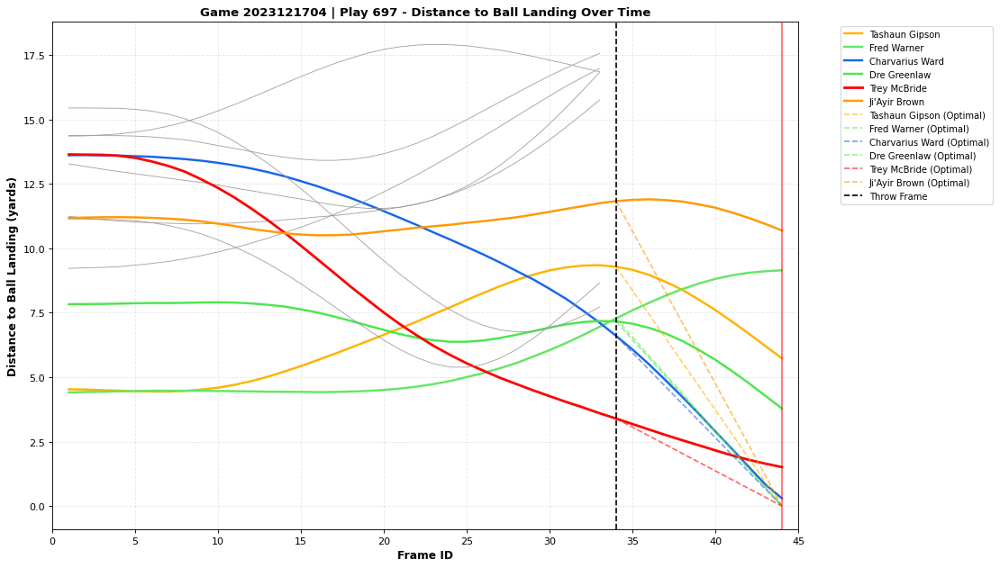

In [ ]:
# Calculate distance data for each player
dlp_results = []

for player in players:
    pname = player['name']
    x_al = player['x']
    y_al = player['y']

    # Get valid frames for this player
    valid_mask = ~(np.isnan(x_al) | np.isnan(y_al))
    valid_indices = np.where(valid_mask)[0]

    if len(valid_indices) < 2:
        continue

    # Collect ALL frames starting from frame 1 for visualization
    all_frame_indices = valid_indices

    distances_all = []
    all_frame_nums = []

    for idx in all_frame_indices:
        x_pos = float(x_al[idx])
        y_pos = float(y_al[idx])
        dist = np.sqrt((x_pos - bx)**2 + (y_pos - by)**2)
        distances_all.append(dist)
        all_frame_nums.append(int(frames_all[idx]))

    if distances_all:
        dlp_results.append({
            'name': pname,
            'frames': all_frame_nums,
            'distances': distances_all,
            'color': player['color'],
            'alpha': player['alpha'],
            'line_width': player['line_width'],
            'is_key_player': player['is_key_player'],
        })

# Create figure
fig, ax = plt.subplots(figsize=(14, 8), dpi=80)

# Plot distance to ball for each player
for result in dlp_results:
    # Only add to legend if player is NOT gray (i.e., is tracked)
    if result['color'] != (0.6, 0.6, 0.6):
        ax.plot(result['frames'], result['distances'],
               color=result['color'], linewidth=result['line_width'],
               alpha=result['alpha'], label=result['name'])
    else:
        ax.plot(result['frames'], result['distances'],
               color=result['color'], linewidth=result['line_width'],
               alpha=result['alpha'])

# Add optimal path for players in color_map (starting from throw_frame)
# Calculate optimal distance progression - only plot from throw_frame onwards
min_frame = int(frames_all[0])
max_frame = int(frames_all[-1])

# For each player with color assignment, calculate optimal distance
for player in players:
    # if not player['has_color']:
    #     continue

    # Skip gray players from optimal path plotting
    if player['color'] == (0.6, 0.6, 0.6):
        continue

    pname = player['name']
    x_al = player['x']
    y_al = player['y']

    # Find first valid position in TRUE window (starting from throw_frame)
    valid_mask = ~(np.isnan(x_al) | np.isnan(y_al))
    valid_indices = np.where(valid_mask)[0]

    if len(valid_indices) == 0:
        continue

    # Find first position at or after throw_frame
    throw_idx = None
    for idx in valid_indices:
        if frames_all[idx] >= output_start:
            throw_idx = idx
            break

    if throw_idx is None:
        continue

    # Distance at throw_frame
    xs = float(x_al[throw_idx])
    ys = float(y_al[throw_idx])
    d_at_throw = np.sqrt((xs - bx)**2 + (ys - by)**2)

    # Create optimal progression from throw_frame to landing
    true_frames_range = np.arange(output_start, total_frames + 1)
    optimal_distances = []

    for fid in true_frames_range:
        progress = (fid - output_start) / max(1, (total_frames - output_start))
        progress = np.clip(progress, 0.0, 1.0)
        optimal_dist = d_at_throw * (1.0 - progress)
        optimal_distances.append(optimal_dist)

    # Plot optimal for players with color assignment
    player_color = player['color']
    ax.plot(true_frames_range, optimal_distances,
           color=player_color, linewidth=1.5, linestyle='--',
           alpha=0.6, label=f"{pname} (Optimal)")

ax.axvline(x=throw_frame, color='black', linestyle='--', linewidth=1.5, label='Throw Frame')
ax.set_xlabel('Frame ID', fontsize=11, fontweight='bold')
ax.set_ylabel('Distance to Ball Landing (yards)', fontsize=11, fontweight='bold')
ax.set_title(f'Game {game_id} | Play {play_id} - Distance to Ball Landing Over Time',
            fontsize=12, fontweight='bold')
# Set x-axis to start from frame 1
ax.set_xlim(min_frame - 1, max_frame + 1)
ax.grid(True, linestyle='--', alpha=0.3)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, ncol=1)

# Add animated red cursor line
cursor_line = ax.axvline(x=min_frame, color='red', linestyle='-', linewidth=1.5, alpha=0.6, zorder=10)

# Animation function for cursor
def animate_cursor(frame_num):
    cursor_line.set_xdata([frame_num, frame_num])
    return [cursor_line]

# Create animation
FRAME_SKIP = 1
INTERVAL_MS = 100  # 100ms interval = 10 fps
anim_frames = frames_all[::FRAME_SKIP]

anim = FuncAnimation(fig, animate_cursor, frames=anim_frames, interval=INTERVAL_MS,
                    blit=True, repeat=True, repeat_delay=1000)

plt.tight_layout()
print("Graph complete!\n")

# Store figure and animation for export
distance_animation_fig = fig
distance_animation_cursor = animate_cursor
distance_animation_frames = anim_frames

anim

### **SECTION 4: CALCULATING LATERAL AND LONGITUDINAL DEVIATION**

---

####This section calculates the longitudinal (How behind/ahead a player is from his schedule?) and the lateral (How much is the player diverted from the optimal path?) deviation for TRUE players after the ball is thrown in the air
---


Per-player deviation summary (TRUE window):


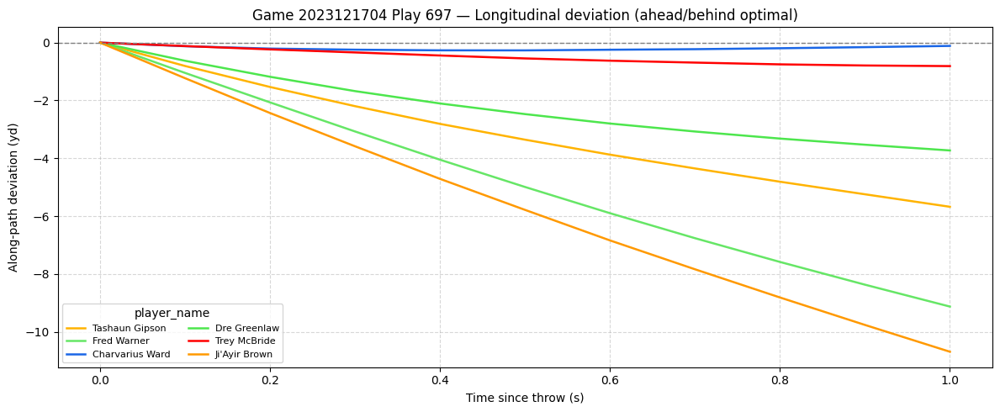

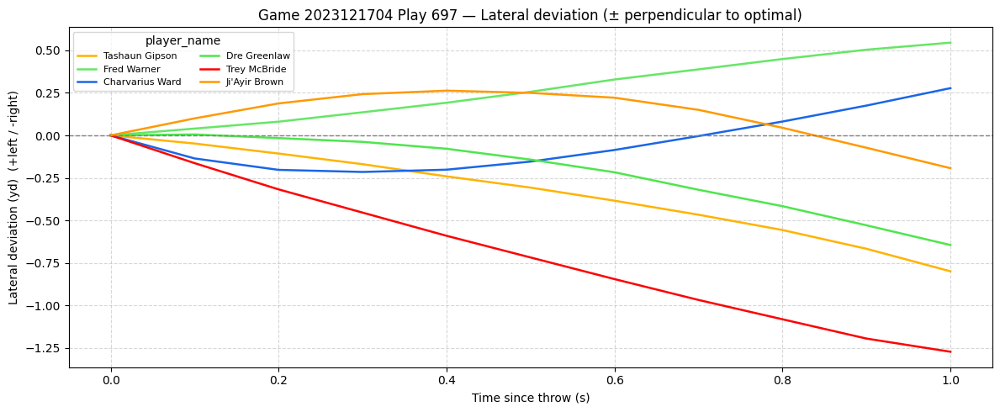

In [ ]:
FPS= 10.0
DT= 1.0 / FPS

# # ========= Determine TRUE window (ball-in-air) =========

fmin = 1
fmax = total_frames
true_start = output_start
true_frames = output_frames

# ========= Deviation computation (all TRUE players) =========
rows = []
dev_series = {}   # for plotting: {player_name: {frame,long,lat}}

for (pid, name), g in play.groupby(['nfl_id','player_name']):
    g = g[g['frame_id'].isin(frames_all[output_start-1:total_frames])]
    if g.empty:
        continue

    # Starting position at the first TRUE frame this player appears in
    f0 = output_start
    if (g['frame_id'] == f0).any():
        xs, ys = float(g.loc[g['frame_id']==f0, 'x'].iloc[0]), float(g.loc[g['frame_id']==f0, 'y'].iloc[0])
    else:
        # if player enters later, start from their first TRUE frame
        xs, ys = float(g['x'].iloc[0]), float(g['y'].iloc[0])
        f0 = int(g['frame_id'].iloc[0])

    # Path to ball
    dir_vec = np.array([bx - xs, by - ys], dtype=float)
    L = float(np.hypot(*dir_vec)) + 1e-9
    u = dir_vec / L  # unit direction

    frames_p = g['frame_id'].to_numpy().astype(int)
    K = len(frames_p)

    if K == 1:
        # Single TRUE frame: zero dev by definition
        long_dev = np.array([0.0])
        lat_dev  = np.array([0.0])
        dev_series[name] = {'frame': frames_p, 'long': long_dev, 'lat': lat_dev}
        final_long = float(long_dev[-1]); final_lat = float(lat_dev[-1])
        final_total = float(np.hypot(final_long, final_lat))
        rows.append({
            'player_name': name,
            'MAE_long(yd)': 0.0, 'RMSE_long(yd)': 0.0,
            'MAE_lat(yd)': 0.0,  'RMSE_lat(yd)': 0.0,
            'Max|lat|(yd)': 0.0, 'Area|lat|(yd*sec)': 0.0,
            'Final_long_dev(yd)': final_long,
            'Final_lat_dev(yd)': final_lat,
            'Final_total_dev(yd)': final_total
        })
        continue

    # Map each TRUE frame to a [0..1] progress so the optimal reaches the ball at true_end
    alphas = (frames_p - true_start) / max(1, (true_end - true_start))  # linear arrival
    alphas = np.clip(alphas, 0.0, 1.0)

    # Actual displacement from start
    xp = g['x'].to_numpy(); yp = g['y'].to_numpy()
    r  = np.stack([xp - xs, yp - ys], axis=1)      # (K,2)

    # Along-path and lateral deviations
    along    = r @ u                                # signed distance along the path
    alongopt = alphas * L                           # optimal along distance
    long_dev = along - alongopt                     # +ahead / -behind

    # Signed lateral = 2D cross(u, r)
    lat_signed = u[0]*r[:,1] - u[1]*r[:,0]
    lat_dev    = lat_signed

    dev_series[name] = {'frame': frames_p, 'long': long_dev, 'lat': lat_dev}

    # Summaries (including "final value" at the last TRUE frame for this player)
    mae_long  = float(np.mean(np.abs(long_dev)))
    rmse_long = float(np.sqrt(np.mean(long_dev**2)))
    mae_lat   = float(np.mean(np.abs(lat_dev)))
    rmse_lat  = float(np.sqrt(np.mean(lat_dev**2)))
    max_abs_lat = float(np.max(np.abs(lat_dev)))
    area_abs_lat= float(np.sum(np.abs(lat_dev)) * DT)

    final_long = float(long_dev[-1])
    final_lat  = float(lat_dev[-1])
    final_total= float(np.hypot(final_long, final_lat))

    rows.append({
        'player_name': name,
        'MAE_long(yd)': mae_long, 'RMSE_long(yd)': rmse_long,
        'MAE_lat(yd)': mae_lat,   'RMSE_lat(yd)': rmse_lat,
        'Max|lat|(yd)': max_abs_lat, 'Area|lat|(yd*sec)': area_abs_lat,
        'Final_long_dev(yd)': final_long,
        'Final_lat_dev(yd)': final_lat,
        'Final_total_dev(yd)': final_total
    })

# ========= Results table (by player_name) =========
metrics = pd.DataFrame(rows).sort_values('Final_total_dev(yd)').reset_index(drop=True)
print("\nPer-player deviation summary (TRUE window):")

# Optionally save
# metrics.to_csv(f'deviation_metrics_{game_id}_{play_id}.csv', index=False)

# ========= Plots (names in legend) =========
# Longitudinal
plt.figure(figsize=(12,5))
for name, ser in dev_series.items():
    t = (ser['frame'] - true_start) * DT
    plt.plot(t, ser['long'], lw=1.8, label=name, color = color_map[name])
plt.axhline(0, ls='--', c='gray', lw=1)
plt.title(f'Game {game_id} Play {play_id} — Longitudinal deviation (ahead/behind optimal)')
plt.xlabel('Time since throw (s)'); plt.ylabel('Along-path deviation (yd)')
plt.grid(True, ls='--', alpha=0.5)
plt.legend(title='player_name', ncol=2, fontsize=8)
plt.tight_layout(); plt.show()

# Lateral
plt.figure(figsize=(12,5))
for name, ser in dev_series.items():
    t = (ser['frame'] - true_start) * DT
    plt.plot(t, ser['lat'], lw=1.8, label=name, color = color_map[name])
plt.axhline(0, ls='--', c='gray', lw=1)
plt.title(f'Game {game_id} Play {play_id} — Lateral deviation (± perpendicular to optimal)')
plt.xlabel('Time since throw (s)'); plt.ylabel('Lateral deviation (yd)  (+left / -right)')
plt.grid(True, ls='--', alpha=0.5)
plt.legend(title='player_name', ncol=2, fontsize=8)
plt.tight_layout(); plt.show()

In [ ]:
metrics

,player_name,MAE_long(yd),RMSE_long(yd),MAE_lat(yd),RMSE_lat(yd),Max|lat|(yd),Area|lat|(yd*sec),Final_long_dev(yd),Final_lat_dev(yd),Final_total_dev(yd)
0,Charvarius Ward,0.185552,0.201228,0.139516,0.163068,0.277886,0.153468,-0.113045,0.277886,0.300000
1,Trey McBride,0.486186,0.555252,0.691799,0.801901,1.273149,0.760979,-0.811166,-1.273149,1.509603
2,Dre Greenlaw,2.227921,2.518577,0.219004,0.308614,0.645207,0.240905,-3.728580,-0.645207,3.783993
3,Tashaun Gipson,3.150930,3.615500,0.340761,0.421681,0.799837,0.374837,-5.676818,-0.799837,5.732888
4,Fred Warner,4.815614,5.621065,0.265553,0.322175,0.545620,0.292108,-9.128105,0.545620,9.144397
5,Ji'Ayir Brown,5.608131,6.546567,0.156945,0.178954,0.263095,0.172639,-10.690166,-0.192999,10.691908


### **SECTION 5: CALCULATING RADIAL EXCESS AND GENERATING PEI VALUES**

---



####This section introduces 'radial excess' parameter (It calculates the radial error of the player relative to the ball landing point). We also generate PEI values and rank the TRUE players involved in the play.
---

Enter pass result type (C/I/IN): IN
Available game_ids: [2023090700 2023091000 2023091001 2023091003 2023091004 2023091005
 2023091006 2023091008 2023091009 2023091010]...

Enter game_id or 'random': 2023121704
✓ Using game_id: 2023121704
  (2 plays available in Game 2023121704 with result 'IN')

  Available play_ids in Game 2023121704: [ 697 3602]...
Enter play_id or 'random': 697
✓ Using play_id: 697

SELECTED PLAY: Game 2023121704, Play 697, Pass Result: IN

The loaded play consists of 44 frames in total. It has 11 frames in the output which begins at frame 34
Game 2023121704, Play 697, Throw Frame: 34.0
Pass Result: IN
Targeted Receiver: Trey McBride - Route: HITCH
Intercepting Player: Charvarius Ward


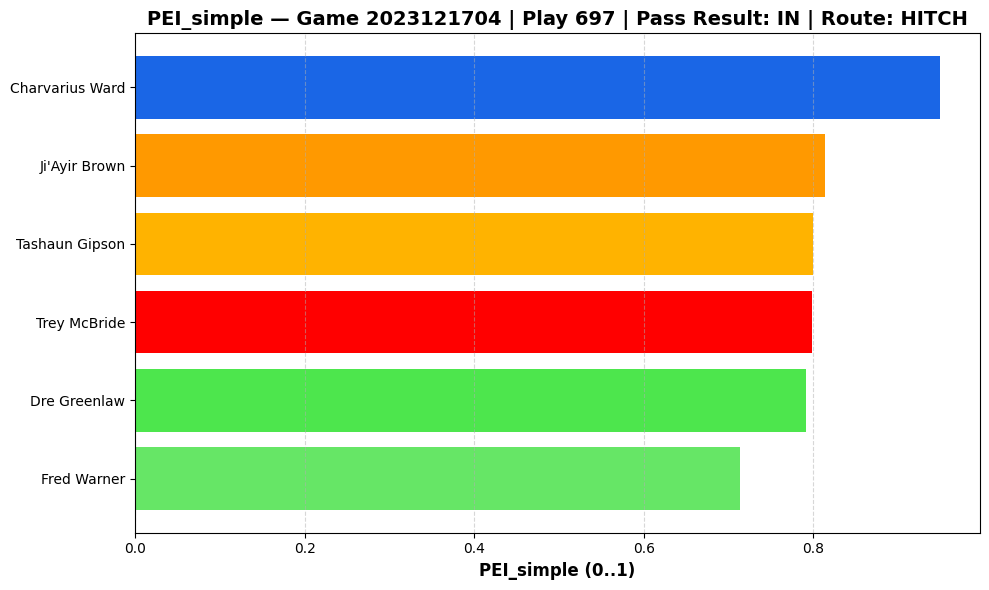


Simple Pursuit Efficiency Index (PEI) — 1 = perfect | Route: HITCH
    player_name  PEI_simple  dir_MAE_norm  path_MAE_norm  rad_excess_mean_norm  L_path_to_ball
Charvarius Ward    0.949307      0.006339       0.000000              0.145739        6.602698
  Ji'Ayir Brown    0.814104      0.013263       0.473910              0.070516       11.833736
 Tashaun Gipson    0.800183      0.036694       0.339297              0.223459        9.286648
   Trey McBride    0.798106      0.203800       0.143228              0.258653        3.394497
   Dre Greenlaw    0.791366      0.030569       0.310973              0.284361        7.164363
    Fred Warner    0.713217      0.036480       0.661537              0.162332        7.279429

PEI ADJUSTMENTS APPLIED:

🎯 Charvarius Ward - Intercepting Defender
   Logic: Interception Bonus
   Component Changes:
      • path_MAE_norm:       0.028 → 0.000 (zeroed)
      • dir_MAE_norm:        0.021 → 0.006 (70% reduction)
      • rad_excess_mean_norm: 0.486 

In [ ]:
#Enter C- Completed, I- Incomplete, IN - Intercepted
pass_result_filter = input("Enter pass result type (C/I/IN): ").strip().upper()

# Filter plays by pass result and check availability
available_plays = merged[merged["pass_result"] == pass_result_filter]

# Get unique game_id and play_id combinations
unique_plays = available_plays.groupby(["game_id", "play_id"]).size().reset_index(name="count")

# User input for game_id
print(f"Available game_ids: {unique_plays['game_id'].astype(int).unique()[:10]}...\n")

game_id_input = input("Enter game_id or 'random': ").strip()

if game_id_input.lower() == "random":
    game_id = int(unique_plays["game_id"].sample(n=1).iloc[0])
    print(f"✓ Randomly selected game_id: {game_id}")

elif game_id_input.strip() == "":
    # If user enters nothing, keep the existing game_id
    print("Continuing with previous game_id:", game_id)

else:
    # If the user typed a valid number, convert it
    game_id = int(game_id_input)
    print("✓ Using game_id:", game_id)


#Filter to plays in the selected game
plays_in_game = unique_plays[unique_plays["game_id"] == game_id].copy()

print(f"  ({len(plays_in_game)} plays available in Game {game_id} with result '{pass_result_filter}')\n")
print(f"  Available play_ids in Game {game_id}: {plays_in_game['play_id'].unique()[:20]}...")

play_id_input = input("Enter play_id or 'random': ").strip()

if play_id_input.lower() == "random":
    play_id = int(plays_in_game["play_id"].sample(n=1).iloc[0])
    print(f"✓ Randomly selected play_id: {play_id}")

elif play_id_input.strip() == "":
    # If user enters nothing, keep the existing game_id
    print("Continuing with previous play_id:", play_id)
else:
    # If the user typed a valid number, convert it
    play_id = int(play_id_input)
    print("✓ Using play_id:", play_id)

print(f"\n{'='*100}")
print(f"SELECTED PLAY: Game {game_id}, Play {play_id}, Pass Result: {pass_result_filter}")
print(f"{'='*100}\n")

# Subset that play
df_play = merged[(merged[['game_id', 'play_id']]==[game_id,play_id]).all(axis=1)].reset_index(drop=True).copy()
df_play = df_play.sort_values(["nfl_id", "frame_id"])

# Get pass result, targeted receiver, and route
pass_result = df_play["pass_result"].iloc[0]
targeted_route = df_play["route_of_targeted_receiver"].iloc[0] if "route_of_targeted_receiver" in df_play.columns else "Unknown"

# Identify targeted receiver by player_role column
targeted_receiver_data = df_play[df_play["player_role"] == "Targeted Receiver"]
if not targeted_receiver_data.empty:
    targeted_receiver = targeted_receiver_data["player_name"].iloc[0]
else:
    targeted_receiver = None

#Calculating frame details for the corresponding play
total_frames = max(df_play['frame_id'])
output_frames = int(df_play['num_frames_output'].iloc[0])
output_start = total_frames - output_frames + 1

print(f"The loaded play consists of {total_frames} frames in total. It has {output_frames} frames in the output which begins at frame {output_start}")

# Compute throw frame
num_frames_output = df_play["num_frames_output"].iloc[0]
max_frame = df_play["frame_id"].max()
min_frame = df_play["frame_id"].min()
throw_frame = max_frame - num_frames_output + 1

# TRUE window (ball-in-air)
true_end = max_frame
true_start = max_frame - num_frames_output + 1
true_frames = np.arange(true_start, true_end + 1)

# Ball landing (static target)
bx = float(df_play["ball_land_x"].dropna().iloc[0])
by = float(df_play["ball_land_y"].dropna().iloc[0])

# Keep ALL frames for distance plotting
df_play_all = df_play.copy()

# Keep TRUE frames only for PEI calculation
df_play_true = df_play[df_play["frame_id"].isin(true_frames)].copy()

print(f"Game {game_id}, Play {play_id}, Throw Frame: {throw_frame}")
print(f"Pass Result: {pass_result}")
print(f"Targeted Receiver: {targeted_receiver} - Route: {targeted_route}")

# Track adjustments for summary
adjustments_made = []

# For interceptions, find the defender closest to ball landing point at final frame
intercepting_player = None
if pass_result == "IN":
    final_frame_data = df_play_true[df_play_true["frame_id"] == true_end]
    defenders = final_frame_data[final_frame_data["player_side"] == "Defense"]
    if not defenders.empty:
        defenders_with_dist = defenders.copy()
        defenders_with_dist["dist_to_ball"] = np.hypot(
            defenders_with_dist["x"] - bx,
            defenders_with_dist["y"] - by
        )
        intercepting_player = defenders_with_dist.loc[defenders_with_dist["dist_to_ball"].idxmin(), "player_name"]
        print(f"Intercepting Player: {intercepting_player}")

# Calculate PEI for each player and store distance data for ALL frames
pei_results = []
distance_data = {}

# First, get distance data for ALL frames
for player_id, group in df_play_all.groupby("nfl_id"):
    player_name = group["player_name"].iloc[0]
    g = group.sort_values("frame_id").copy()
    frames_all = g["frame_id"].to_numpy().astype(int)

    # Store distance data for plotting (ALL frames)
    actual_distance_all = np.hypot(g["x"].to_numpy() - bx, g["y"].to_numpy() - by)

    # Calculate optimal distance starting from throw frame
    throw_frame_mask = frames_all >= throw_frame
    if np.any(throw_frame_mask):
        throw_idx = np.where(throw_frame_mask)[0][0]
        x_at_throw = g.iloc[throw_idx]["x"]
        y_at_throw = g.iloc[throw_idx]["y"]

        # Distance at throw frame
        d_at_throw = np.hypot(x_at_throw - bx, y_at_throw - by)

        # Calculate optimal linear progression from throw frame to ball landing
        frames_from_throw = frames_all[throw_frame_mask]
        alphas_from_throw = (frames_from_throw - throw_frame) / max(1, (true_end - throw_frame))
        alphas_from_throw = np.clip(alphas_from_throw, 0.0, 1.0)

        # Optimal distance: linear decrease from d_at_throw to 0
        optimal_distance_from_throw = d_at_throw * (1.0 - alphas_from_throw)

        # Full optimal array (NaN before throw, then optimal progression)
        optimal_distance_all = np.full_like(actual_distance_all, np.nan, dtype=float)
        optimal_distance_all[throw_frame_mask] = optimal_distance_from_throw
    else:
        optimal_distance_all = np.full_like(actual_distance_all, np.nan, dtype=float)

    distance_data[player_name] = {
        "frames": frames_all,
        "actual_distance": actual_distance_all,
        "optimal_distance": optimal_distance_all
    }

# Now calculate PEI for TRUE frames only
for player_id, group in df_play_true.groupby("nfl_id"):
    player_name = group["player_name"].iloc[0]
    player_role = group["player_role"].iloc[0] if "player_role" in group.columns else None
    player_side = group["player_side"].iloc[0] if "player_side" in group.columns else None
    g = group.sort_values("frame_id").copy()
    frames = g["frame_id"].to_numpy().astype(int)
    K = len(frames)

    if K < 2:
        pei_results.append({
            "player_name": player_name,
            "PEI_simple": 1.0,
            "dir_MAE_norm": 0.0,
            "path_MAE_norm": 0.0,
            "rad_excess_mean_norm": 0.0,
            "L_path_to_ball": 0.0
        })
        continue

    # Start at this player's first TRUE frame (throw frame)
    xs, ys = float(g.iloc[0]["x"]), float(g.iloc[0]["y"])

    # Vector to ball from throw position + length and unit
    v = np.array([bx - xs, by - ys], dtype=float)
    L = float(np.hypot(*v)) + 1e-9
    u = v / L

    # Linear progress schedule alpha(t) from 0→1 across TRUE frames
    alphas = (frames - true_start) / max(1, (true_end - true_start))
    alphas = np.clip(alphas, 0.0, 1.0)

    # Actual displacement from start
    xp = g["x"].to_numpy()
    yp = g["y"].to_numpy()
    r = np.stack([xp - xs, yp - ys], axis=1)

    # FIX: Path-based components - these were commented out in original code
    along = r @ u  # Projection along optimal path
    along_opt = alphas * L  # Expected progress along optimal path
    long_dev = along - along_opt  # Longitudinal deviation (timing)
    lat_dev = u[0] * r[:, 1] - u[1] * r[:, 0]  # Lateral deviation (direction)

    # Distance-to-ball component
    d_actual = np.hypot(xp - bx, yp - by)
    d_opt = (1.0 - alphas) * L

    # Use minimum distance achieved for hitch route handling
    min_distance_achieved = np.min(d_actual)
    rad_excess_min = np.maximum(0.0, d_actual - min_distance_achieved)

    # Normalize by L and average across frames (bounded 0..1)
    dir_MAE_norm = float(np.clip(np.mean(np.abs(lat_dev)) / L, 0.0, 1.0))
    path_MAE_norm = float(np.clip(np.mean(np.abs(long_dev)) / L, 0.0, 1.0))
    rad_mean_norm = float(np.clip(np.mean(rad_excess_min) / L, 0.0, 1.0))

    # Store original values for adjustments tracking
    original_dir = dir_MAE_norm
    original_path = path_MAE_norm
    original_rad = rad_mean_norm

    # Check if this defender should be awarded for tight coverage
    is_close_defender = False
    if player_side == "Defense" and pass_result == "I":
        last_10_frames = sorted(frames)[-10:] if len(frames) >= 10 else frames
        targeted_receiver_data_check = df_play_true[
            (df_play_true["player_role"] == "Targeted Receiver") &
            (df_play_true["frame_id"].isin(last_10_frames))
        ]

        if not targeted_receiver_data_check.empty:
            defender_last_frames = g[g["frame_id"].isin(last_10_frames)]

            for _, def_frame in defender_last_frames.iterrows():
                tgt_frame = targeted_receiver_data_check[
                    targeted_receiver_data_check["frame_id"] == def_frame["frame_id"]
                ]
                if not tgt_frame.empty:
                    dist = np.hypot(
                        def_frame["x"] - tgt_frame.iloc[0]["x"],
                        def_frame["y"] - tgt_frame.iloc[0]["y"]
                    )
                    if dist <= 2.0:
                        is_close_defender = True
                        break

    # Outcome-adjusted components BEFORE PEI calculation
    if pass_result == "C" and player_role == "Targeted Receiver":
        path_MAE_norm = 0.0
        dir_MAE_norm = dir_MAE_norm * 0.3
        rad_mean_norm = rad_mean_norm * 0.3
        adjustments_made.append({
            "player_name": player_name,
            "role": "Targeted Receiver (Caught)",
            "adjustment_type": "Completion Bonus",
            "path_change": f"{original_path:.3f} → 0.000 (zeroed)",
            "dir_change": f"{original_dir:.3f} → {dir_MAE_norm:.3f} (70% reduction)",
            "rad_change": f"{original_rad:.3f} → {rad_mean_norm:.3f} (70% reduction)"
        })

    elif pass_result == "IN" and player_name == intercepting_player:
        path_MAE_norm = 0.0
        dir_MAE_norm = dir_MAE_norm * 0.3
        rad_mean_norm = rad_mean_norm * 0.3
        adjustments_made.append({
            "player_name": player_name,
            "role": "Intercepting Defender",
            "adjustment_type": "Interception Bonus",
            "path_change": f"{original_path:.3f} → 0.000 (zeroed)",
            "dir_change": f"{original_dir:.3f} → {dir_MAE_norm:.3f} (70% reduction)",
            "rad_change": f"{original_rad:.3f} → {rad_mean_norm:.3f} (70% reduction)"
        })

    elif is_close_defender:
        dir_MAE_norm = dir_MAE_norm * 0.5
        path_MAE_norm = path_MAE_norm * 0.5
        rad_mean_norm = rad_mean_norm * 0.5
        adjustments_made.append({
            "player_name": player_name,
            "role": "Tight Coverage Defender",
            "adjustment_type": "Tight Coverage Bonus (within 2 yards in last 10 frames)",
            "path_change": f"{original_path:.3f} → {path_MAE_norm:.3f} (50% reduction)",
            "dir_change": f"{original_dir:.3f} → {dir_MAE_norm:.3f} (50% reduction)",
            "rad_change": f"{original_rad:.3f} → {rad_mean_norm:.3f} (50% reduction)"
        })

    # Simple hybrid: equal parts of the three
    PEI_simple = 1.0 - (dir_MAE_norm + path_MAE_norm + rad_mean_norm) / 3.0
    PEI_simple = float(np.clip(PEI_simple, 0.0, 1.0))

    pei_results.append({
        "player_name": player_name,
        "PEI_simple": PEI_simple,
        "dir_MAE_norm": dir_MAE_norm,
        "path_MAE_norm": path_MAE_norm,
        "rad_excess_mean_norm": rad_mean_norm,
        "L_path_to_ball": float(L)
    })

# Convert to DataFrame
pei_df = pd.DataFrame(pei_results).sort_values("PEI_simple", ascending=False).reset_index(drop=True)

all_players_in_play = df_play_all[['player_name', 'player_side', 'player_position']].drop_duplicates()
color_map = build_color_map(all_players_in_play, df_play_all, targeted_receiver)

# Building PEI Bar Chart
fig, ax = plt.subplots(figsize=(10, 6))

colors = [get_player_color(name, color_map, has_pei=True) for name in pei_df["player_name"]]

ax.barh(pei_df["player_name"], pei_df["PEI_simple"], color=colors)
ax.invert_yaxis()
ax.set_xlabel("PEI_simple (0..1)", fontsize=12, fontweight="bold")
ax.set_title(f"PEI_simple — Game {game_id} | Play {play_id} | Pass Result: {pass_result} | Route: {targeted_route}",
             fontsize=14, fontweight="bold")
ax.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# Print PEI results
print("\n" + "="*100)
print(f"Simple Pursuit Efficiency Index (PEI) — 1 = perfect | Route: {targeted_route}")
print("="*100)
print(pei_df[["player_name", "PEI_simple", "dir_MAE_norm", "path_MAE_norm",
              "rad_excess_mean_norm", "L_path_to_ball"]].to_string(index=False))
print("="*100)

# Print adjustments summary
if adjustments_made:
    print("\n" + "="*100)
    print("PEI ADJUSTMENTS APPLIED:")
    print("="*100)
    for adj in adjustments_made:
        print(f"\n🎯 {adj['player_name']} - {adj['role']}")
        print(f"   Logic: {adj['adjustment_type']}")
        print(f"   Component Changes:")
        print(f"      • path_MAE_norm:       {adj['path_change']}")
        print(f"      • dir_MAE_norm:        {adj['dir_change']}")
        print(f"      • rad_excess_mean_norm: {adj['rad_change']}")

    print("\n" + "="*100)
    print("ADJUSTMENT LOGIC SUMMARY:")
    print("="*100)
    print("1. Completion Bonus (Targeted Receiver catches ball):")
    print("   - path_MAE_norm set to 0 (timing was perfect)")
    print("   - dir_MAE_norm and rad_excess_mean_norm reduced by 70%")
    print("\n2. Interception Bonus (Defender closest to ball at final frame on IN plays):")
    print("   - path_MAE_norm set to 0 (timing was perfect)")
    print("   - dir_MAE_norm and rad_excess_mean_norm reduced by 70%")
    print("\n3. Tight Coverage Bonus (Defender within 2 yards of targeted receiver in last 10 frames on I plays):")
    print("   - All three components reduced by 50%")
    print("="*100)
else:
    print("\n" + "="*100)
    print("No PEI adjustments applied (standard calculation for all players)")
    print("="*100)

### **SECTION 6: PLAYER PEI RANKING BY POSITION**

---



#### We are ranking players based on their positions across the season.
---

In [ ]:
# 🎯 Filter only players_to_predict == True
df_pred = merged[merged["player_to_predict"] == True].copy()

# Pre-compute TRUE frames using vectorized operations
df_pred['max_frame'] = df_pred.groupby(['game_id', 'play_id'])['frame_id'].transform('max')
df_pred['min_frame'] = df_pred.groupby(['game_id', 'play_id'])['frame_id'].transform('min')
df_pred['throw_frame'] = df_pred['max_frame'] - df_pred['num_frames_output'] + 1
df_pred['true_start'] = df_pred[['min_frame', 'throw_frame']].max(axis=1)
df_pred['true_end'] = df_pred['max_frame']
df_pred['is_true_frame'] = (df_pred['frame_id'] >= df_pred['true_start']) & (df_pred['frame_id'] <= df_pred['true_end'])

# Filter to TRUE frames only
df_true = df_pred[df_pred['is_true_frame']].copy()

print(f"Processing {len(df_true)} TRUE frame rows...")

# Pre-identify intercepting defenders and tight coverage defenders per play
interception_bonuses = []
tight_coverage_bonuses = []

for (game_id, play_id), play_group in df_true.groupby(['game_id', 'play_id']):
    pass_result = play_group['pass_result'].iloc[0]
    true_end = play_group['true_end'].iloc[0]
    bx = float(play_group['ball_land_x'].iloc[0])
    by = float(play_group['ball_land_y'].iloc[0])

    # Interception bonus
    if pass_result == 'IN':
        final_frame = play_group[play_group['frame_id'] == true_end]
        defenders = final_frame[final_frame['player_side'] == 'Defense']
        if not defenders.empty:
            defenders = defenders.copy()
            defenders['dist_to_ball'] = np.hypot(defenders['x'] - bx, defenders['y'] - by)
            intercepting_nfl_id = defenders.loc[defenders['dist_to_ball'].idxmin(), 'nfl_id']
            interception_bonuses.append((game_id, play_id, intercepting_nfl_id))

    # Tight coverage bonus
    if pass_result == 'I':
        max_frame_in_play = play_group['frame_id'].max()
        last_10_start = max_frame_in_play - 9
        last_10_frames = play_group[play_group['frame_id'] >= last_10_start]

        targeted_receiver = last_10_frames[last_10_frames['player_role'] == 'Targeted Receiver']
        defenders = last_10_frames[last_10_frames['player_side'] == 'Defense']

        if not targeted_receiver.empty and not defenders.empty:
            for frame_id in last_10_frames['frame_id'].unique():
                tr_frame = targeted_receiver[targeted_receiver['frame_id'] == frame_id]
                def_frame = defenders[defenders['frame_id'] == frame_id]

                if not tr_frame.empty and not def_frame.empty:
                    tr_x, tr_y = tr_frame.iloc[0][['x', 'y']]
                    def_frame = def_frame.copy()
                    def_frame['dist_to_tr'] = np.hypot(def_frame['x'] - tr_x, def_frame['y'] - tr_y)
                    close_defenders = def_frame[def_frame['dist_to_tr'] <= 2.0]['nfl_id'].unique()

                    for nfl_id in close_defenders:
                        if (game_id, play_id, nfl_id) not in tight_coverage_bonuses:
                            tight_coverage_bonuses.append((game_id, play_id, nfl_id))

interception_set = set(interception_bonuses)
tight_coverage_set = set(tight_coverage_bonuses)

print(f"Found {len(interception_set)} interceptions and {len(tight_coverage_set)} tight coverage instances")

# Calculate PEI for each player in each play
all_pei_results = []

for (game_id, play_id, nfl_id), group in df_true.groupby(["game_id", "play_id", "nfl_id"]):
    player_name = group["player_name"].iloc[0]
    player_position = group["player_position"].iloc[0]
    player_role = group["player_role"].iloc[0] if "player_role" in group.columns else None
    player_side = group["player_side"].iloc[0] if "player_side" in group.columns else None
    pass_result = group["pass_result"].iloc[0]

    g = group.sort_values("frame_id")
    frames = g["frame_id"].to_numpy().astype(int)
    K = len(frames)

    if K < 2:
        all_pei_results.append({
            "nfl_id": nfl_id,
            "player_name": player_name,
            "player_position": player_position,
            "game_id": game_id,
            "play_id": play_id,
            "PEI_simple": 1.0,
            "dir_MAE_norm": 0.0,
            "path_MAE_norm": 0.0,
            "rad_excess_mean_norm": 0.0,
            "L_path_to_ball": 0.0,
            "frames_after_throw": group["num_frames_output"].iloc[0]
        })
        continue

    # Ball landing
    bx = float(g['ball_land_x'].iloc[0])
    by = float(g['ball_land_y'].iloc[0])

    # Start position
    xs, ys = float(g.iloc[0]["x"]), float(g.iloc[0]["y"])

    # Vector to ball
    v = np.array([bx - xs, by - ys], dtype=float)
    L = float(np.hypot(*v)) + 1e-9
    u = v / L

    # Progress schedule
    true_start = g['true_start'].iloc[0]
    true_end = g['true_end'].iloc[0]
    alphas = (frames - true_start) / max(1, (true_end - true_start))
    alphas = np.clip(alphas, 0.0, 1.0)

    # Actual positions
    xp = g["x"].to_numpy()
    yp = g["y"].to_numpy()
    r = np.stack([xp - xs, yp - ys], axis=1)

    # Components
    along = r @ u
    along_opt = alphas * L
    long_dev = along - along_opt
    lat_dev = u[0] * r[:, 1] - u[1] * r[:, 0]

    d_actual = np.hypot(xp - bx, yp - by)
    min_distance_achieved = np.min(d_actual)
    rad_excess_min = np.maximum(0.0, d_actual - min_distance_achieved)

    # Normalize
    dir_MAE_norm = float(np.clip(np.mean(np.abs(lat_dev)) / L, 0.0, 1.0))
    path_MAE_norm = float(np.clip(np.mean(np.abs(long_dev)) / L, 0.0, 1.0))
    rad_mean_norm = float(np.clip(np.mean(rad_excess_min) / L, 0.0, 1.0))

    # Apply bonuses
    lookup_key = (game_id, play_id, nfl_id)

    if pass_result == "C" and player_role == "Targeted Receiver":
        path_MAE_norm = 0.0
        dir_MAE_norm *= 0.3
        rad_mean_norm *= 0.3
    elif lookup_key in interception_set:
        path_MAE_norm = 0.0
        dir_MAE_norm *= 0.3
        rad_mean_norm *= 0.3
    elif lookup_key in tight_coverage_set:
        dir_MAE_norm *= 0.5
        path_MAE_norm *= 0.5
        rad_mean_norm *= 0.5

    # Calculate PEI
    PEI_simple = 1.0 - (dir_MAE_norm + path_MAE_norm + rad_mean_norm) / 3.0
    PEI_simple = float(np.clip(PEI_simple, 0.0, 1.0))

    all_pei_results.append({
        "nfl_id": nfl_id,
        "player_name": player_name,
        "player_position": player_position,
        "game_id": game_id,
        "play_id": play_id,
        "PEI_simple": PEI_simple,
        "dir_MAE_norm": dir_MAE_norm,
        "path_MAE_norm": path_MAE_norm,
        "rad_excess_mean_norm": rad_mean_norm,
        "L_path_to_ball": float(L),
        "frames_after_throw": group["num_frames_output"].iloc[0]
    })

# Convert to DataFrame
pei_df = pd.DataFrame(all_pei_results)
print(f"Calculated PEI for {len(pei_df)} player-play combinations")

# Group by player and calculate averages
player_summary = pei_df.groupby(["nfl_id", "player_name", "player_position"]).agg(
    avg_PEI=("PEI_simple", "mean"),
    avg_dir_MAE=("dir_MAE_norm", "mean"),
    avg_path_MAE=("path_MAE_norm", "mean"),
    avg_rad_excess=("rad_excess_mean_norm", "mean"),
    avg_path_length=("L_path_to_ball", "mean"),
    avg_frames_after_throw=("frames_after_throw", "mean"),
    total_plays_predicted=("PEI_simple", "count")
).reset_index()

# Sort by average PEI (descending = better performance)
player_summary = player_summary.sort_values("avg_PEI", ascending=False).reset_index(drop=True)

# Filter for players with more than 9 plays
player_summary_filtered = player_summary[player_summary["total_plays_predicted"] > 9].reset_index(drop=True)

# Display tables separated by position
print("=" * 100)
print("PLAYER PEI SUMMARY BY POSITION (player_to_predict == True)")
print("=" * 100)

if len(player_summary_filtered) == 0:
    print("\n⚠️  No players found with more than 9 plays.")
    print(f"Total players before filter: {len(player_summary)}")
    print(f"\nPlay count distribution:")
    print(player_summary['total_plays_predicted'].describe())
else:
    positions = sorted(player_summary_filtered["player_position"].unique())

    for position in positions:
        position_df = player_summary_filtered[player_summary_filtered["player_position"] == position].reset_index(drop=True)

        print(f"\n{'='*100}")
        print(f"POSITION: {position}")
        print(f"{'='*100}")
        print(position_df.to_string(index=False))
        print(f"\nPlayers in {position}: {len(position_df)}")
        print(f"Total plays for {position}: {position_df['total_plays_predicted'].sum()}")
        print(f"Avg PEI for {position}: {position_df['avg_PEI'].mean():.4f}")

    print("\n" + "=" * 100)
    print("OVERALL SUMMARY")
    print("=" * 100)
    print(f"Total unique players: {len(player_summary_filtered)}")
    print(f"Total unique plays analyzed: {pei_df[['game_id', 'play_id']].drop_duplicates().shape[0]}")
    print(f"Total player-play combinations: {len(pei_df)}")
    print(f"Overall average PEI: {player_summary_filtered['avg_PEI'].mean():.4f}")
    print("=" * 100)

Processing 562936 TRUE frame rows...
Found 335 interceptions and 3083 tight coverage instances
Calculated PEI for 46045 player-play combinations
PLAYER PEI SUMMARY BY POSITION (player_to_predict == True)

POSITION: CB
 nfl_id          player_name player_position  avg_PEI  avg_dir_MAE  avg_path_MAE  avg_rad_excess  avg_path_length  avg_frames_after_throw  total_plays_predicted
  54694            Bo Melton              CB 0.896874     0.108570      0.031554        0.169255         7.173767               13.714286                     21
  52459         Trevon Diggs              CB 0.809181     0.120711      0.256791        0.194957        10.262383               12.533333                     15
  48476          Nik Needham              CB 0.807999     0.090080      0.183110        0.302811        16.354146               18.666667                     12
  56117          Alex Austin              CB 0.805845     0.109934      0.288016        0.184514        11.502627               14.500000 

##Remove the comment from the following block if you want to export the results to local machine

In [ ]:
# # ========= EXPORT RANKING RESULTS TO CSV =========
# print("\n" + "=" * 100)
# print("EXPORTING ANALYSIS TO CSV FILES")
# print("=" * 100 + "\n")

# output_dir = "/home/claude"
# import os
# os.makedirs(output_dir, exist_ok=True)

# # Export 1: Detailed player-play combinations
# detailed_csv = f"{output_dir}/PEI_Detailed_PlayerPlay.csv"
# pei_df_sorted = pei_df.sort_values(['player_position', 'player_name', 'PEI_simple'], ascending=[True, True, False])
# pei_df_sorted.to_csv(detailed_csv, index=False)
# print(f"✓ Detailed results (player-play combinations): {os.path.basename(detailed_csv)}")
# print(f"  Rows: {len(pei_df_sorted)}")
# print(f"  Size: {os.path.getsize(detailed_csv) / 1024:.1f} KB\n")

# # Export 2: Player summary (aggregated by player)
# summary_csv = f"{output_dir}/PEI_PlayerSummary.csv"
# player_summary_sorted = player_summary.sort_values(['player_position', 'avg_PEI'], ascending=[True, False])
# player_summary_sorted.to_csv(summary_csv, index=False)
# print(f"✓ Player summary (aggregated): {os.path.basename(summary_csv)}")
# print(f"  Rows: {len(player_summary_sorted)}")
# print(f"  Size: {os.path.getsize(summary_csv) / 1024:.1f} KB\n")

# # Export 3: Filtered player summary (>9 plays)
# filtered_csv = f"{output_dir}/PEI_PlayerSummary_Filtered_9Plus.csv"
# player_summary_filtered_sorted = player_summary_filtered.sort_values(['player_position', 'avg_PEI'], ascending=[True, False])
# player_summary_filtered_sorted.to_csv(filtered_csv, index=False)
# print(f"✓ Filtered player summary (>9 plays): {os.path.basename(filtered_csv)}")
# print(f"  Rows: {len(player_summary_filtered_sorted)}")
# print(f"  Size: {os.path.getsize(filtered_csv) / 1024:.1f} KB\n")

# # Download CSV files
# print("=" * 100)
# print("DOWNLOADING CSV FILES")
# print("=" * 100 + "\n")

# csv_files = [detailed_csv, summary_csv, filtered_csv]

# try:
#     from google.colab import files

#     print("Initiating downloads from Google Colab...\n")
#     for csv_file in csv_files:
#         file_name = os.path.basename(csv_file)
#         print(f"  ↓ Downloading: {file_name}")
#         files.download(csv_file)

#     print(f"\n✓ All {len(csv_files)} CSV file(s) downloaded successfully!")

# except ImportError:
#     print("Note: Not running in Google Colab.")
#     print("\nCSV files saved locally at:")
#     for csv_file in csv_files:
#         print(f"  {csv_file}")

# print("\n" + "=" * 100 + "\n")

### **SECTION 7: PEI SUMMARY BY ROUTES AND OFFENSE/DEFENSE**

---



In [ ]:
all_pei_results = []

for (game_id, play_id, nfl_id), group in df_true.groupby(["game_id", "play_id", "nfl_id"]):
    player_name = group["player_name"].iloc[0]
    player_side = group["player_side"].iloc[0]
    player_role = group["player_role"].iloc[0] if "player_role" in group.columns else None
    route = group["route_of_targeted_receiver"].iloc[0]
    pass_length = group["pass_length"].iloc[0]
    pass_result = group["pass_result"].iloc[0]

    g = group.sort_values("frame_id")
    frames = g["frame_id"].to_numpy().astype(int)
    K = len(frames)

    if K < 2:
        all_pei_results.append({
            "game_id": game_id,
            "play_id": play_id,
            "nfl_id": nfl_id,
            "player_name": player_name,
            "player_side": player_side,
            "route_of_targeted_receiver": route,
            "pass_length": pass_length,
            "pass_result": pass_result,
            "PEI_simple": 1.0
        })
        continue

    # Ball landing
    bx = float(g['ball_land_x'].iloc[0])
    by = float(g['ball_land_y'].iloc[0])

    # Start position
    xs, ys = float(g.iloc[0]["x"]), float(g.iloc[0]["y"])

    # Vector to ball
    v = np.array([bx - xs, by - ys], dtype=float)
    L = float(np.hypot(*v)) + 1e-9
    u = v / L

    # Progress schedule
    true_start = g['true_start'].iloc[0]
    true_end = g['true_end'].iloc[0]
    alphas = (frames - true_start) / max(1, (true_end - true_start))
    alphas = np.clip(alphas, 0.0, 1.0)

    # Actual positions
    xp = g["x"].to_numpy()
    yp = g["y"].to_numpy()
    r = np.stack([xp - xs, yp - ys], axis=1)

    # Components
    along = r @ u
    along_opt = alphas * L
    long_dev = along - along_opt
    lat_dev = u[0] * r[:, 1] - u[1] * r[:, 0]

    d_actual = np.hypot(xp - bx, yp - by)
    min_distance_achieved = np.min(d_actual)
    rad_excess_min = np.maximum(0.0, d_actual - min_distance_achieved)

    # Normalize
    dir_MAE_norm = float(np.clip(np.mean(np.abs(lat_dev)) / L, 0.0, 1.0))
    path_MAE_norm = float(np.clip(np.mean(np.abs(long_dev)) / L, 0.0, 1.0))
    rad_mean_norm = float(np.clip(np.mean(rad_excess_min) / L, 0.0, 1.0))

    # Apply bonuses
    lookup_key = (game_id, play_id, nfl_id)

    if pass_result == "C" and player_role == "Targeted Receiver":
        path_MAE_norm = 0.0
        dir_MAE_norm *= 0.3
        rad_mean_norm *= 0.3
    elif lookup_key in interception_set:
        path_MAE_norm = 0.0
        dir_MAE_norm *= 0.3
        rad_mean_norm *= 0.3
    elif lookup_key in tight_coverage_set:
        dir_MAE_norm *= 0.5
        path_MAE_norm *= 0.5
        rad_mean_norm *= 0.5

    # Calculate PEI
    PEI_simple = 1.0 - (dir_MAE_norm + path_MAE_norm + rad_mean_norm) / 3.0
    PEI_simple = float(np.clip(PEI_simple, 0.0, 1.0))

    all_pei_results.append({
        "game_id": game_id,
        "play_id": play_id,
        "nfl_id": nfl_id,
        "player_name": player_name,
        "player_side": player_side,
        "route_of_targeted_receiver": route,
        "pass_length": pass_length,
        "pass_result": pass_result,
        "PEI_simple": PEI_simple
    })

# Convert to DataFrame
pei_df = pd.DataFrame(all_pei_results)

# Count players tracked per play
players_per_play = pei_df.groupby(["game_id", "play_id"]).size().reset_index(name="players_tracked")
pei_df = pei_df.merge(players_per_play, on=["game_id", "play_id"])

# Separate offense and defense
offense_df = pei_df[pei_df["player_side"] == "Offense"].copy()
defense_df = pei_df[pei_df["player_side"] == "Defense"].copy()

# Aggregate by route
offense_summary = offense_df.groupby("route_of_targeted_receiver").agg(
    avg_PEI_offense=("PEI_simple", "mean"),
    num_plays_offense=("PEI_simple", "count")
).reset_index()

defense_summary = defense_df.groupby("route_of_targeted_receiver").agg(
    avg_PEI_defense=("PEI_simple", "mean"),
    num_plays_defense=("PEI_simple", "count")
).reset_index()

play_counts = pei_df.groupby(["route_of_targeted_receiver", "game_id", "play_id"])["players_tracked"].first().reset_index()
players_tracked_summary = play_counts.groupby("route_of_targeted_receiver").agg(
    avg_players_tracked_minus_1=("players_tracked", lambda x: x.mean() - 1)
).reset_index()

pass_length_summary = pei_df.groupby("route_of_targeted_receiver").agg(
    avg_pass_length=("pass_length", "mean")
).reset_index()

# Count interceptions per route
interception_summary = pei_df[pei_df["pass_result"] == "IN"].groupby("route_of_targeted_receiver").agg(
    num_interceptions=("pass_result", "count")
).reset_index()

# Merge summaries
route_summary = offense_summary.merge(defense_summary, on="route_of_targeted_receiver", how="outer")
route_summary = route_summary.merge(players_tracked_summary, on="route_of_targeted_receiver", how="outer")
route_summary = route_summary.merge(pass_length_summary, on="route_of_targeted_receiver", how="outer")
route_summary = route_summary.merge(interception_summary, on="route_of_targeted_receiver", how="outer")
route_summary = route_summary.fillna(0)
route_summary["num_plays_offense"] = route_summary["num_plays_offense"].astype(int)
route_summary["num_plays_defense"] = route_summary["num_plays_defense"].astype(int)
route_summary["num_interceptions"] = route_summary["num_interceptions"].astype(int)
route_summary = route_summary.sort_values("route_of_targeted_receiver").reset_index(drop=True)

# Display
print("=" * 100)
print("ROUTE PEI SUMMARY (Offense vs Defense)")
print("=" * 100)
print(route_summary.to_string(index=False))
print("=" * 100)
print(f"\nTotal unique routes: {len(route_summary)}")
print(f"Total unique plays analyzed: {pei_df[['game_id', 'play_id']].drop_duplicates().shape[0]}")
print(f"Total interceptions: {interception_summary['num_interceptions'].sum()}")
print("\nNote: Higher PEI = Better pursuit efficiency (0 to 1 scale)")
print("\nBonus Logic Applied:")
print("- Completion: Targeted receiver gets path_MAE_norm=0.0, dir/rad multiplied by 0.3")
print("- Interception: Defender gets path_MAE_norm=0.0, dir/rad multiplied by 0.3")
print("- Tight Coverage (Incomplete): Defenders within 2.0 yards get all components multiplied by 0.5")
print("=" * 100)

ROUTE PEI SUMMARY (Offense vs Defense)
route_of_targeted_receiver  avg_PEI_offense  num_plays_offense  avg_PEI_defense  num_plays_defense  avg_players_tracked_minus_1  avg_pass_length  num_interceptions
                     ANGLE         0.901550                544         0.785205                617                     1.134191         3.407407                 32
                    CORNER         0.885142                509         0.783447               1646                     3.233792        20.903016                103
                     CROSS         0.913123               1496         0.748491               3381                     2.260027        10.234981                176
                      FLAT         0.922870               1983         0.771021               2226                     1.122542         0.841055                 22
                        GO         0.871383               1397         0.805739               4082                     2.921976        24.800

In [ ]:
# Pre-identify completion bonuses and defensive bonuses
completion_bonuses = set()
interception_bonuses = set()
tight_coverage_bonuses = set()

for (game_id, play_id), play_group in df_true.groupby(['game_id', 'play_id']):
    pass_result = play_group['pass_result'].iloc[0]
    true_end = play_group['true_end'].iloc[0]
    bx = float(play_group['ball_land_x'].iloc[0])
    by = float(play_group['ball_land_y'].iloc[0])

    # Completion bonus - targeted receiver who caught
    if pass_result == 'C':
        targeted = play_group[play_group['player_role'] == 'Targeted Receiver']
        if not targeted.empty:
            nfl_id = targeted['nfl_id'].iloc[0]
            completion_bonuses.add((game_id, play_id, nfl_id))

    # Interception bonus - defender closest to ball at play end
    if pass_result == 'IN':
        final_frame = play_group[play_group['frame_id'] == true_end]
        defenders = final_frame[final_frame['player_side'] == 'Defense']
        if not defenders.empty:
            defenders = defenders.copy()
            defenders['dist_to_ball'] = np.hypot(defenders['x'] - bx, defenders['y'] - by)
            intercepting_nfl_id = defenders.loc[defenders['dist_to_ball'].idxmin(), 'nfl_id']
            interception_bonuses.add((game_id, play_id, intercepting_nfl_id))

    # Tight coverage bonus - defenders within 2.0 yards of targeted receiver in last 10 frames
    if pass_result == 'I':
        max_frame_in_play = play_group['frame_id'].max()
        last_10_start = max_frame_in_play - 9
        last_10_frames = play_group[play_group['frame_id'] >= last_10_start]

        targeted_receiver = last_10_frames[last_10_frames['player_role'] == 'Targeted Receiver']
        defenders = last_10_frames[last_10_frames['player_side'] == 'Defense']

        if not targeted_receiver.empty and not defenders.empty:
            for frame_id in last_10_frames['frame_id'].unique():
                tr_frame = targeted_receiver[targeted_receiver['frame_id'] == frame_id]
                def_frame = defenders[defenders['frame_id'] == frame_id]

                if not tr_frame.empty and not def_frame.empty:
                    tr_x, tr_y = tr_frame.iloc[0][['x', 'y']]
                    def_frame = def_frame.copy()
                    def_frame['dist_to_tr'] = np.hypot(def_frame['x'] - tr_x, def_frame['y'] - tr_y)
                    close_defenders = def_frame[def_frame['dist_to_tr'] <= 2.0]['nfl_id'].unique()

                    for nfl_id in close_defenders:
                        if (game_id, play_id, nfl_id) not in tight_coverage_bonuses:
                            tight_coverage_bonuses.add((game_id, play_id, nfl_id))

# Calculate PEI for each player in each play
all_pei_results = []

for (game_id, play_id, nfl_id), group in df_true.groupby(["game_id", "play_id", "nfl_id"]):
    player_side = group["player_side"].iloc[0]
    player_role = group["player_role"].iloc[0] if "player_role" in group.columns else None
    route = group["route_of_targeted_receiver"].iloc[0]
    pass_length = group["pass_length"].iloc[0]
    pass_result = group["pass_result"].iloc[0]

    g = group.sort_values("frame_id")
    frames = g["frame_id"].to_numpy().astype(int)
    K = len(frames)

    if K < 2:
        all_pei_results.append({
            "game_id": game_id,
            "play_id": play_id,
            "nfl_id": nfl_id,
            "player_side": player_side,
            "route_of_targeted_receiver": route,
            "pass_length": pass_length,
            "pass_result": pass_result,
            "PEI_simple": 1.0
        })
        continue

    # Ball landing
    bx = float(g['ball_land_x'].iloc[0])
    by = float(g['ball_land_y'].iloc[0])

    # Start position
    xs, ys = float(g.iloc[0]["x"]), float(g.iloc[0]["y"])

    # Vector to ball
    v = np.array([bx - xs, by - ys], dtype=float)
    L = float(np.hypot(*v)) + 1e-9
    u = v / L

    # Progress schedule
    true_start = g['true_start'].iloc[0]
    true_end = g['true_end'].iloc[0]
    alphas = (frames - true_start) / max(1, (true_end - true_start))
    alphas = np.clip(alphas, 0.0, 1.0)

    # Actual positions
    xp = g["x"].to_numpy()
    yp = g["y"].to_numpy()
    r = np.stack([xp - xs, yp - ys], axis=1)

    # Components
    along = r @ u
    along_opt = alphas * L
    long_dev = along - along_opt
    lat_dev = u[0] * r[:, 1] - u[1] * r[:, 0]

    d_actual = np.hypot(xp - bx, yp - by)
    min_distance_achieved = np.min(d_actual)
    rad_excess_min = np.maximum(0.0, d_actual - min_distance_achieved)

    # Normalize
    dir_MAE_norm = float(np.clip(np.mean(np.abs(lat_dev)) / L, 0.0, 1.0))
    path_MAE_norm = float(np.clip(np.mean(np.abs(long_dev)) / L, 0.0, 1.0))
    rad_mean_norm = float(np.clip(np.mean(rad_excess_min) / L, 0.0, 1.0))

    # Apply bonuses
    lookup_key = (game_id, play_id, nfl_id)

    # Completion bonus: Targeted receiver on completed pass
    if lookup_key in completion_bonuses:
        path_MAE_norm = 0.0
        dir_MAE_norm *= 0.3
        rad_mean_norm *= 0.3
    # Interception bonus: Defender who intercepted the ball
    elif lookup_key in interception_bonuses:
        path_MAE_norm = 0.0
        dir_MAE_norm *= 0.3
        rad_mean_norm *= 0.3
    # Tight coverage bonus: Defender in coverage on incomplete pass
    elif lookup_key in tight_coverage_bonuses:
        dir_MAE_norm *= 0.5
        path_MAE_norm *= 0.5
        rad_mean_norm *= 0.5

    # Calculate PEI
    PEI_simple = 1.0 - (dir_MAE_norm + path_MAE_norm + rad_mean_norm) / 3.0
    PEI_simple = float(np.clip(PEI_simple, 0.0, 1.0))

    all_pei_results.append({
        "game_id": game_id,
        "play_id": play_id,
        "nfl_id": nfl_id,
        "player_side": player_side,
        "route_of_targeted_receiver": route,
        "pass_length": pass_length,
        "pass_result": pass_result,
        "PEI_simple": PEI_simple
    })

# Convert to DataFrame
pei_df = pd.DataFrame(all_pei_results)

# Filter for offense only
offense_df = pei_df[pei_df["player_side"] == "Offense"].copy()

# Group by pass completion status
completion_summary = offense_df.groupby("pass_result").agg(
    avg_PEI_offense=("PEI_simple", "mean"),
    median_PEI_offense=("PEI_simple", "median"),
    num_plays=("PEI_simple", "count"),
    std_PEI=("PEI_simple", "std")
).reset_index()

# Also calculate overall stats
overall_stats = pd.DataFrame([{
    "pass_result": "ALL PASSES",
    "avg_PEI_offense": offense_df["PEI_simple"].mean(),
    "median_PEI_offense": offense_df["PEI_simple"].median(),
    "num_plays": len(offense_df),
    "std_PEI": offense_df["PEI_simple"].std()
}])

# Combine
completion_summary = pd.concat([completion_summary, overall_stats], ignore_index=True)

# Display the results
print("=" * 100)
print("OFFENSIVE PEI BY PASS COMPLETION STATUS")
print("=" * 100)
print(completion_summary.to_string(index=False))
print("=" * 100)
print("\nNote: Higher PEI = Better pursuit efficiency (0 to 1 scale)")
print("\nBonus Logic Applied:")
print("- Completion: Targeted receiver gets path_MAE_norm=0.0, dir/rad multiplied by 0.3")
print("- Interception: Defender gets path_MAE_norm=0.0, dir/rad multiplied by 0.3")
print("- Tight Coverage (Incomplete): Defenders within 2.0 yards get all components multiplied by 0.5")
print("=" * 100)

# Additional breakdown by route for completed vs incomplete
print("\n" + "=" * 100)
print("OFFENSIVE PEI BY ROUTE AND COMPLETION STATUS")
print("=" * 100)

route_completion_summary = offense_df.groupby(["route_of_targeted_receiver", "pass_result"]).agg(
    avg_PEI=("PEI_simple", "mean"),
    num_plays=("PEI_simple", "count")
).reset_index()

# Pivot to show completed vs incomplete side by side
route_pivot = route_completion_summary.pivot_table(
    index="route_of_targeted_receiver",
    columns="pass_result",
    values=["avg_PEI", "num_plays"],
    fill_value=0
).reset_index()

# Flatten column names
route_pivot.columns = ['_'.join(str(col).strip() for col in cols if col) if isinstance(cols, tuple) else cols
                       for cols in route_pivot.columns.values]
route_pivot.columns = [col.replace('route_of_targeted_receiver_', 'route') for col in route_pivot.columns]

print(route_pivot.to_string(index=False))
print("=" * 100)

OFFENSIVE PEI BY PASS COMPLETION STATUS
pass_result  avg_PEI_offense  median_PEI_offense  num_plays  std_PEI
          C         0.947364            0.952882       9738 0.025423
          I         0.791686            0.818380       4032 0.101435
         IN         0.779010            0.814258        338 0.115254
 ALL PASSES         0.898839            0.949266      14108 0.094629

Note: Higher PEI = Better pursuit efficiency (0 to 1 scale)

Bonus Logic Applied:
- Completion: Targeted receiver gets path_MAE_norm=0.0, dir/rad multiplied by 0.3
- Interception: Defender gets path_MAE_norm=0.0, dir/rad multiplied by 0.3
- Tight Coverage (Incomplete): Defenders within 2.0 yards get all components multiplied by 0.5

OFFENSIVE PEI BY ROUTE AND COMPLETION STATUS
route_of_targeted_receiver  avg_PEI_C  avg_PEI_I  avg_PEI_IN  num_plays_C  num_plays_I  num_plays_IN
                     ANGLE   0.935187   0.737910    0.722988        452.0         82.0          10.0
                    CORNER   0.9